# Creates gif of the evolution of the training process
The plot contains two subplots
- Level sets of the predictions of the model at epoch
- Loss at epoch

In [29]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
import matplotlib.pyplot as plt
import numpy as np

# Juptyer magic: For export. Makes the plots size right for the screen 
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

%config InlineBackend.figure_formats = ['svg'] 


torch.backends.cudnn.deterministic = True
torch.manual_seed(2)
torch.cuda.manual_seed(2)

g = torch.Generator()
g.manual_seed(1)


# Data preparation

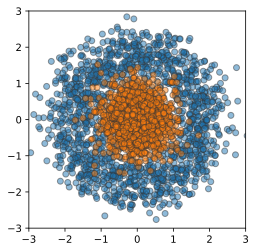

In [30]:
data_noise = 0.25
plotlim = [-3, 3]
subfolder = 'evo_circ'


from models.training import create_dataloader
dataloader, dataloader_viz = create_dataloader('circles', noise = data_noise, plotlim = plotlim)


In [31]:
#We can now conveniently access the data from the dataloaders
for X_test, y_test in dataloader_viz:
    print(X_test[:10], y_test[:10])
    break
    

tensor([[-0.3591, -1.2550],
        [-1.1139, -1.0091],
        [ 0.2077,  0.1953],
        [-0.2199, -0.2853],
        [ 1.0657,  1.4272],
        [ 1.1204, -0.7574],
        [ 1.0353,  0.3297],
        [-0.0684, -0.0813],
        [-1.1614,  1.4806],
        [-1.1995,  0.0650]]) tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 1])


# Model dynamics

In [32]:
#Import of the model dynamics that describe the neural ODE
#The dynamics are based on the torchdiffeq package, that implements ODE solvers in the pytorch setting
from models.neural_odes import NeuralODE

#for neural ODE based networks the network width is constant. In this example the input is 2 dimensional
hidden_dim, data_dim = 2, 2 
augment_dim = 0

#T is the end time of the neural ODE evolution, num_steps are the amount of discretization steps for the ODE solver
T, num_steps = 20, 20 
bound = 0.
fp = False #this recent change made things not work anymore
cross_entropy = True
turnpike = False

non_linearity = 'tanh' #'relu' #
architecture = 'inside' #outside



torch.manual_seed(2)
torch.cuda.manual_seed(2)
anode = NeuralODE(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode = torch.optim.Adam(anode.parameters(), lr=1e-3) 


print(anode)

NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
        (5): Linear(in_features=2, out_features=2, bias=True)
        (6): Linear(in_features=2, out_features=2, bias=True)
        (7): Linear(in_features=2, out_features=2, bias=True)
        (8): Linear(in_features=2, out_features=2, bias=True)
        (9): Linear(in_features=2, out_features=2, bias=True)
        (10): Linear(in_features=2, out_features=2, bias=True)
        (11): Linear(in_features=2, out_features=2, bias=True)
        (12): Linear(in_features=2, out_features=2, bias=True)
        (13): Linear(in_features=2, out_features=2, bias=True)
        (14

In [33]:
torch.manual_seed(2)
torch.cuda.manual_seed(2)
rnode = NeuralODE(device, data_dim, hidden_dim, augment_dim=0, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_rnode = torch.optim.Adam(rnode.parameters(), lr=1e-3) 


print(rnode)

NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
        (5): Linear(in_features=2, out_features=2, bias=True)
        (6): Linear(in_features=2, out_features=2, bias=True)
        (7): Linear(in_features=2, out_features=2, bias=True)
        (8): Linear(in_features=2, out_features=2, bias=True)
        (9): Linear(in_features=2, out_features=2, bias=True)
        (10): Linear(in_features=2, out_features=2, bias=True)
        (11): Linear(in_features=2, out_features=2, bias=True)
        (12): Linear(in_features=2, out_features=2, bias=True)
        (13): Linear(in_features=2, out_features=2, bias=True)
        (14

# Training and generating level sets

In [34]:
from models.training import Trainer, doublebackTrainer
import imageio, os
from plots.plots import train_to_classifier_imgs

num_epochs = 120 #number of optimization runs in which the dataset is used for gradient decent
plotfreq = 5


trainer_anode = doublebackTrainer(anode, optimizer_anode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = 0, eps_comp = 0.2) 

   
train_to_classifier_imgs(anode, trainer_anode, dataloader, subfolder, num_epochs, plotfreq)

0.2

Iteration 0/45
Loss: 1.042
Robust Term Loss: 0.120
Accuracy: 0.453

Iteration 10/45
Loss: 0.928
Robust Term Loss: 0.089
Accuracy: 0.406

Iteration 20/45
Loss: 0.731
Robust Term Loss: 0.050
Accuracy: 0.531

Iteration 30/45
Loss: 0.832
Robust Term Loss: 0.033
Accuracy: 0.344

Iteration 40/45
Loss: 0.778
Robust Term Loss: 0.023
Accuracy: 0.422
Epoch 1: 0.814
0.2

Iteration 0/45
Loss: 0.735
Robust Term Loss: 0.024
Accuracy: 0.453

Iteration 10/45
Loss: 0.752
Robust Term Loss: 0.025
Accuracy: 0.453

Iteration 20/45
Loss: 0.679
Robust Term Loss: 0.023
Accuracy: 0.562

Iteration 30/45
Loss: 0.756
Robust Term Loss: 0.022
Accuracy: 0.375

Iteration 40/45
Loss: 0.721
Robust Term Loss: 0.022
Accuracy: 0.453
Epoch 2: 0.713
0.2

Iteration 0/45
Loss: 0.687
Robust Term Loss: 0.020
Accuracy: 0.453

Iteration 10/45
Loss: 0.691
Robust Term Loss: 0.025
Accuracy: 0.453

Iteration 20/45
Loss: 0.652
Robust Term Loss: 0.022
Accuracy: 0.562

Iteration 30/45
Loss: 0.694
Robust Term Loss: 0.023
Accuracy: 0

In [35]:
from models.training import Trainer, doublebackTrainer
import imageio, os


trainer_rnode = doublebackTrainer(rnode, optimizer_rnode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = 0.2) 



train_to_classifier_imgs(rnode, trainer_rnode, dataloader, subfolder, num_epochs, plotfreq, filename = 'rob')

0.2

Iteration 0/45
Loss: 0.954
Robust Term Loss: 0.120
Accuracy: 0.453

Iteration 10/45
Loss: 0.827
Robust Term Loss: 0.087
Accuracy: 0.406

Iteration 20/45
Loss: 0.631
Robust Term Loss: 0.050
Accuracy: 0.547

Iteration 30/45
Loss: 0.693
Robust Term Loss: 0.030
Accuracy: 0.344

Iteration 40/45
Loss: 0.644
Robust Term Loss: 0.021
Accuracy: 0.422
Epoch 1: 0.704
0.2

Iteration 0/45
Loss: 0.613
Robust Term Loss: 0.022
Accuracy: 0.453

Iteration 10/45
Loss: 0.625
Robust Term Loss: 0.021
Accuracy: 0.453

Iteration 20/45
Loss: 0.564
Robust Term Loss: 0.017
Accuracy: 0.562

Iteration 30/45
Loss: 0.627
Robust Term Loss: 0.015
Accuracy: 0.375

Iteration 40/45
Loss: 0.599
Robust Term Loss: 0.015
Accuracy: 0.453
Epoch 2: 0.594
0.2

Iteration 0/45
Loss: 0.579
Robust Term Loss: 0.015
Accuracy: 0.453

Iteration 10/45
Loss: 0.581
Robust Term Loss: 0.016
Accuracy: 0.453

Iteration 20/45
Loss: 0.545
Robust Term Loss: 0.012
Accuracy: 0.562

Iteration 30/45
Loss: 0.586
Robust Term Loss: 0.011
Accuracy: 0

# Loss plots

trainer_rnode.eps = 0.2
epoch = 5


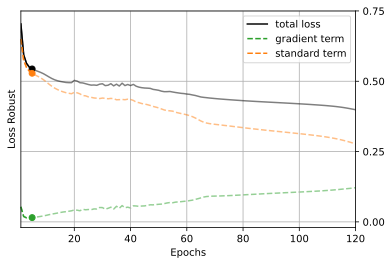

no filename given


In [36]:
from enum import auto

from plots.plots import loss_evolution
print(f'{trainer_rnode.eps = }')
loss_evolution(trainer_rnode, 5)

epoch = 5


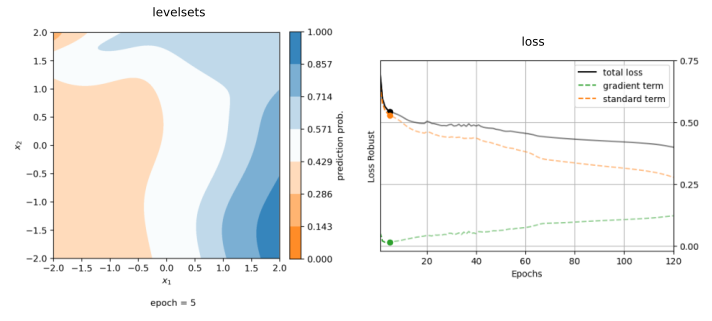

In [37]:
from plots.plots import comparison_plot

epoch = 5
fig_name_base = os.path.join(subfolder, '')
loss_evolution(trainer_rnode, epoch, 'loss_pic')
comparison_plot(fig_name_base + str(epoch) + '.png', 'levelsets', 'loss_pic.png', 'loss', 'test', show = True, figsize = (10,5))

## gif generation

In [38]:
from plots.gifs import evo_gif
gif = evo_gif(trainer_anode, num_epochs, plotfreq, subfolder, '')

5
epoch = 5
10
epoch = 10
15
epoch = 15
20
epoch = 20
25
epoch = 25
30
epoch = 30
35
epoch = 35
40
epoch = 40
45
epoch = 45
50
epoch = 50
55
epoch = 55
60
epoch = 60
65
epoch = 65
70
epoch = 70
75
epoch = 75
80
epoch = 80
85
epoch = 85
90
epoch = 90
95
epoch = 95
100
epoch = 100
105
epoch = 105
110
epoch = 110
115
epoch = 115
120
epoch = 120
evo_circ/evo.gif  created


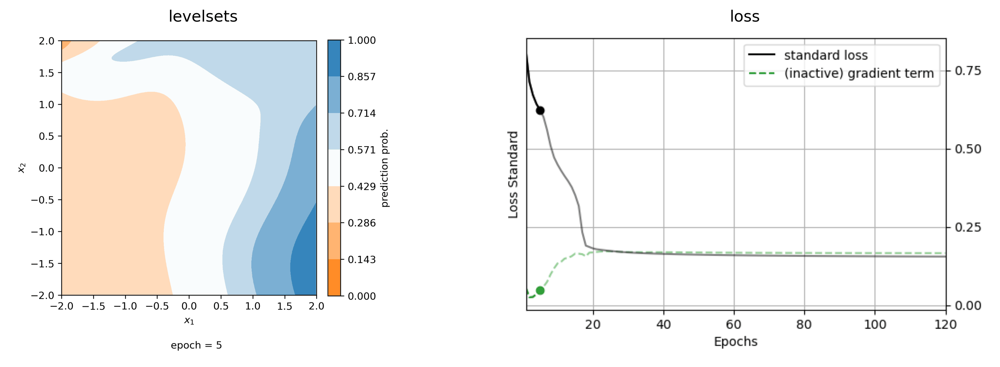

In [39]:
from IPython.display import Image
Image(filename = gif, width = 800)

5
epoch = 5
10
epoch = 10
15
epoch = 15
20
epoch = 20
25
epoch = 25
30
epoch = 30
35
epoch = 35
40
epoch = 40
45
epoch = 45
50
epoch = 50
55
epoch = 55
60
epoch = 60
65
epoch = 65
70
epoch = 70
75
epoch = 75
80
epoch = 80
85
epoch = 85
90
epoch = 90
95
epoch = 95
100
epoch = 100
105
epoch = 105
110
epoch = 110
115
epoch = 115
120
epoch = 120
evo_circ/robevo.gif  created


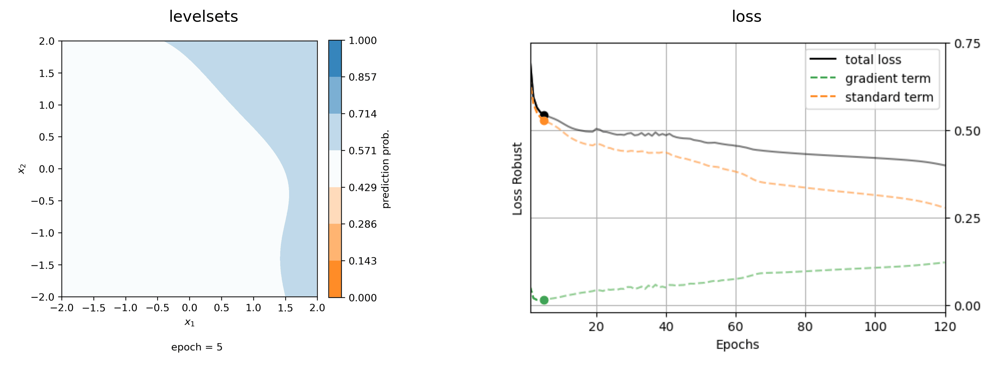

In [40]:
rob_gif = evo_gif(trainer_rnode, num_epochs, plotfreq, subfolder, 'rob')

from IPython.display import Image
Image(filename = rob_gif, width = 800)

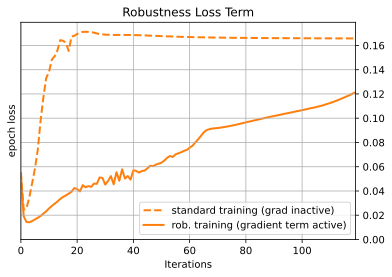

In [41]:
labelsize = 10
plt.plot(trainer_anode.histories['epoch_loss_rob_history'],'--', linewidth = 2, color = 'C1')
plt.title('Robustness Loss Term')
plt.plot(trainer_rnode.histories['epoch_loss_rob_history'], zorder = -1, linewidth = 2, color = 'C1')
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations', size = labelsize)
plt.ylabel('epoch loss', size = labelsize)
plt.legend(['standard training (grad inactive)', 'rob. training (gradient term active)'], prop= {'size': labelsize})
# plt.yticks(np.arange(0,1.25,0.25))
ax = plt.gca()
ax.yaxis.tick_right()
plt.grid()

plt.savefig('loss_comp_grads.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()

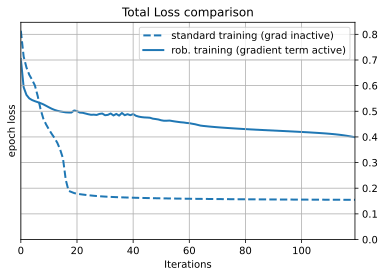

In [42]:
labelsize = 10
plt.plot(trainer_anode.histories['epoch_loss_history'],'--', linewidth = 2, color = 'C0')
plt.title('Total Loss comparison')
plt.plot(trainer_rnode.histories['epoch_loss_history'], zorder = -1, linewidth = 2, color = 'C0')
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations', size = labelsize)
plt.ylabel('epoch loss', size = labelsize)
plt.legend(['standard training (grad inactive)', 'rob. training (gradient term active)'], prop= {'size': labelsize})
# plt.yticks(np.arange(0,1.25,0.25))
ax = plt.gca()
ax.yaxis.tick_right()
plt.grid()

plt.savefig('loss_comp_grads.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()